# Phase 5.4 — Geospatial Tiled YOLO Inference

### Purpose
Run the trained solar-panel YOLO detector on the **full original Surat/SAM tiles** without losing geographic alignment.

The detector was trained at `imgsz=640`, and testing showed that panels are detected much better when the image is viewed at a smaller crop scale. Therefore this notebook uses **overlapping tiled inference**:

**original SAM tile → overlapping crops → YOLO → translate boxes back to original tile pixels → deduplicate → pixel → lat/lon → GeoJSON**

### Important project rule
We never treat a YOLO crop as a new geographic tile. Every detection is converted back into the **original tile pixel coordinate system** before any geographic conversion.

This keeps Phase 4 (`tile_registry.json` + `footprints.geojson`) and Phase 5 compatible with the final clickable Leaflet map.

### Outputs
- `solar_panel_detections.csv`
- `solar_panels.geojson`
- `solar_panel_detections_visualized/` — original tiles with final boxes

> Start with a T4 GPU runtime in Colab.


## 1. Install dependencies

This notebook intentionally avoids a heavy external slicing framework. The tiling, coordinate translation, and duplicate-removal logic are kept explicit so we know exactly how coordinates flow into the GIS stage.

In [ ]:

!pip install -q ultralytics geopandas shapely rasterio opencv-python matplotlib pandas

import os, json, math, shutil
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ultralytics import YOLO
import geopandas as gpd
from shapely.geometry import Polygon

print("Dependencies ready.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 75.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 6.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Dependencies ready.


## 2. Upload the required project files

Upload:

1. your trained `best.pt`
2. the 5 original Surat tiles
3. `tile_registry.json`

Use the **same original tiles used by Phase 4 / SAM**, not screenshots that have been resized, compressed, or cropped differently.

Expected tile IDs:

- `tile_17`
- `tile_18`
- `tile_19`
- `tile_21`
- `tile_22`


In [ ]:

from google.colab import files

uploaded = files.upload()
print("\nUploaded:")
for name in uploaded:
    print(" -", name)


Saving best.pt to best.pt
Saving Screenshot 2026-08-22 175234.png to Screenshot 2026-08-22 175234.png
Saving Screenshot 2026-08-22 175320.png to Screenshot 2026-08-22 175320.png
Saving Screenshot 2026-08-22 175411.png to Screenshot 2026-08-22 175411.png
Saving Screenshot 2026-08-22 175504.png to Screenshot 2026-08-22 175504.png
Saving Screenshot 2026-08-22 175546.png to Screenshot 2026-08-22 175546.png
Saving tile_registry.json to tile_registry.json

Uploaded:
 - best.pt
 - Screenshot 2026-08-22 175234.png
 - Screenshot 2026-08-22 175320.png
 - Screenshot 2026-08-22 175411.png
 - Screenshot 2026-08-22 175504.png
 - Screenshot 2026-08-22 175546.png
 - tile_registry.json


In [ ]:
import os
import json

pt_files = [f for f in os.listdir('.') if f.lower().endswith('.pt')]
print("PT files:", pt_files)

if not pt_files:
    raise FileNotFoundError("Upload your trained best.pt first.")

MODEL_PATH = 'best.pt' if os.path.exists('best.pt') else pt_files[0]

if not os.path.exists('tile_registry.json'):
    raise FileNotFoundError("tile_registry.json was not uploaded.")

with open('tile_registry.json', 'r') as f:
    tile_registry = json.load(f)

print("Model:", MODEL_PATH)
print("Registered tile IDs:", list(tile_registry.keys()))

PT files: ['best.pt']
Model: best.pt
Registered tile IDs: ['tile_17', 'tile_18', 'tile_19', 'tile_21', 'tile_22']


## 3. Match the five tile IDs to the uploaded image files

The previous Phase 4 notebook used these mappings. This cell first tries to find those filenames, then prints what is available.

If the printed mapping is wrong, edit `filename_map` manually before continuing.


In [ ]:

filename_map = {
    'tile_17': 'Screenshot 2026-08-22 175234.png',
    'tile_18': 'Screenshot 2026-08-22 175320.png',
    'tile_19': 'Screenshot 2026-08-22 175411.png',
    'tile_21': 'Screenshot 2026-08-22 175504.png',
    'tile_22': 'Screenshot 2026-08-22 175546.png'
}

missing = [f for f in filename_map.values() if not os.path.exists(f)]

if missing:
    print("Some expected filenames are not present:")
    for f in missing:
        print("  ", f)
    print("\nFiles currently present:")
    image_files = [
        f for f in os.listdir('.')
        if f.lower().endswith(('.png','.jpg','.jpeg','.tif','.tiff'))
    ]
    for f in image_files:
        print("  ", f)
    print("\nIf needed, edit filename_map above.")

print("\nTile mapping:")
for tid, fn in filename_map.items():
    print(f"{tid}: {fn} -> {'OK' if os.path.exists(fn) else 'MISSING'}")



Tile mapping:
tile_17: Screenshot 2026-08-22 175234.png -> OK
tile_18: Screenshot 2026-08-22 175320.png -> OK
tile_19: Screenshot 2026-08-22 175411.png -> OK
tile_21: Screenshot 2026-08-22 175504.png -> OK
tile_22: Screenshot 2026-08-22 175546.png -> OK


## 4. Load YOLO and inspect the actual tile dimensions

Do **not** resize or overwrite the source tiles.

The original dimensions are part of the geographic coordinate relationship established by Phase 4.


In [ ]:
from ultralytics import YOLO
model = YOLO(MODEL_PATH)

tile_info = {}

for tile_id, filename in filename_map.items():
    if not os.path.exists(filename):
        continue

    img = cv2.imread(filename)
    if img is None:
        raise ValueError(f"Could not read {filename}")

    h, w = img.shape[:2]
    tile_info[tile_id] = {'width': w, 'height': h}

    print(f"{tile_id}: {w} × {h} pixels")

print("\nModel loaded successfully.")


tile_17: 1731 × 950 pixels
tile_18: 1727 × 950 pixels
tile_19: 1726 × 944 pixels
tile_21: 1726 × 949 pixels
tile_22: 1728 × 950 pixels

Model loaded successfully.


## 5. Scale calibration — verify the problem before the full run

We already know from your experiment that a smaller crop works much better. This cell gives us a controlled check on one tile.

It compares:
- full tile at `imgsz=640`
- full tile at `imgsz=1280`
- a crop approximately `1/8` of the original width/height, run at `imgsz=640`

The crop is only a **diagnostic** here. It is not yet the final pipeline.

If the crop produces substantially better detections, that confirms the scale hypothesis.


Calibration tile: tile_17 (1731 × 950)
Full tile @ 640 : 0 detections
Full tile @1280 : 52 detections
Diagnostic crop: 216 × 118 pixels
1/8 crop @640: 0 detections


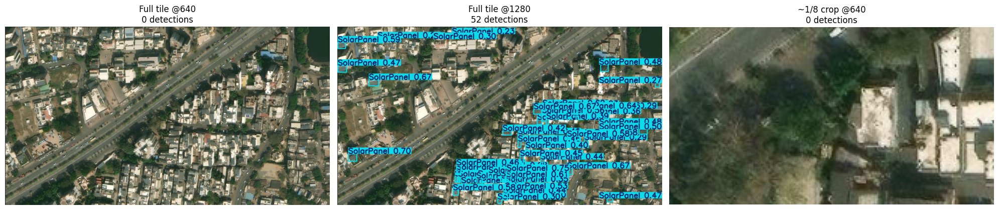

In [ ]:

CALIBRATION_TILE_ID = next(iter(tile_info))
calib_file = filename_map[CALIBRATION_TILE_ID]
CALIB_CONF = 0.20
crop_fraction = 1/8

img = cv2.imread(calib_file)
h, w = img.shape[:2]

print(f"Calibration tile: {CALIBRATION_TILE_ID} ({w} × {h})")

r640 = model.predict(calib_file, imgsz=640, conf=CALIB_CONF, verbose=False)[0]
r1280 = model.predict(calib_file, imgsz=1280, conf=CALIB_CONF, verbose=False)[0]

print("Full tile @ 640 :", len(r640.boxes), "detections")
print("Full tile @1280 :", len(r1280.boxes), "detections")

cw = max(64, int(w * crop_fraction))
ch = max(64, int(h * crop_fraction))
x0 = max(0, (w - cw) // 2)
y0 = max(0, (h - ch) // 2)

crop = img[y0:y0+ch, x0:x0+cw]
crop_result = model.predict(crop, imgsz=640, conf=CALIB_CONF, verbose=False)[0]

print(f"Diagnostic crop: {cw} × {ch} pixels")
print("1/8 crop @640:", len(crop_result.boxes), "detections")

fig, axes = plt.subplots(1, 3, figsize=(20, 7))
axes[0].imshow(cv2.cvtColor(r640.plot(), cv2.COLOR_BGR2RGB))
axes[0].set_title(f"Full tile @640\n{len(r640.boxes)} detections")
axes[1].imshow(cv2.cvtColor(r1280.plot(), cv2.COLOR_BGR2RGB))
axes[1].set_title(f"Full tile @1280\n{len(r1280.boxes)} detections")
axes[2].imshow(cv2.cvtColor(crop_result.plot(), cv2.COLOR_BGR2RGB))
axes[2].set_title(f"~1/8 crop @640\n{len(crop_result.boxes)} detections")
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()


## 6. Final tiled-inference configuration

### Starting values
- `CROP_FRACTION = 1/8` of the original tile width/height
- `OVERLAP = 0.25`
- `YOLO_IMGSZ = 640`
- `CONF = 0.25`

If your successful experiment used a **different exact crop size**, change `CROP_FRACTION` before the full run.

The crop size is measured in **original image pixels**. YOLO may resize that crop internally to 640, but we retain the original crop offset so every output box can be returned to the original tile coordinate system.


In [ ]:

CROP_FRACTION = 1/8
OVERLAP = 0.25
YOLO_IMGSZ = 640
CONF = 0.25

MIN_CROP_SIZE = 320
MAX_CROP_SIZE = 1280

NMS_IOU = 0.45

print("CROP_FRACTION =", CROP_FRACTION)
print("OVERLAP       =", OVERLAP)
print("YOLO_IMGSZ    =", YOLO_IMGSZ)
print("CONF          =", CONF)
print("NMS_IOU       =", NMS_IOU)


CROP_FRACTION = 0.125
OVERLAP       = 0.25
YOLO_IMGSZ    = 640
CONF          = 0.25
NMS_IOU       = 0.45


## 7. Generate overlapping crops

The last row/column is always included, so the entire original tile is covered.

Each crop is represented as:

`(x0, y0, x1, y1)`

in **original tile pixel coordinates**.


In [ ]:

def make_crop_windows(width, height, crop_fraction=1/8, overlap=0.25,
                      min_crop=320, max_crop=1280):
    """Generate overlapping crop windows covering the complete image."""
    crop_w = int(round(width * crop_fraction))
    crop_h = int(round(height * crop_fraction))

    crop_w = min(max(crop_w, min_crop), max_crop, width)
    crop_h = min(max(crop_h, min_crop), max_crop, height)

    step_x = max(1, int(round(crop_w * (1 - overlap))))
    step_y = max(1, int(round(crop_h * (1 - overlap))))

    xs = list(range(0, max(width - crop_w, 0) + 1, step_x))
    ys = list(range(0, max(height - crop_h, 0) + 1, step_y))

    last_x = max(0, width - crop_w)
    last_y = max(0, height - crop_h)

    if not xs or xs[-1] != last_x:
        xs.append(last_x)
    if not ys or ys[-1] != last_y:
        ys.append(last_y)

    windows = []
    seen = set()

    for y0 in ys:
        for x0 in xs:
            win = (int(x0), int(y0), int(x0 + crop_w), int(y0 + crop_h))
            if win not in seen:
                windows.append(win)
                seen.add(win)

    return windows


for tile_id, info in tile_info.items():
    wins = make_crop_windows(
        info['width'], info['height'],
        CROP_FRACTION, OVERLAP,
        MIN_CROP_SIZE, MAX_CROP_SIZE
    )
    print(f"{tile_id}: {len(wins)} YOLO crops")


tile_17: 28 YOLO crops
tile_18: 28 YOLO crops
tile_19: 28 YOLO crops
tile_21: 28 YOLO crops
tile_22: 28 YOLO crops


## 8. Run YOLO on every crop and translate boxes back

For each crop:

1. YOLO predicts a box in crop coordinates.
2. Add `(x0, y0)` to move it into original-tile coordinates.
3. Clip it to the original tile.
4. Store the detection with tile ID and confidence.

No latitude/longitude is calculated yet. First we create one clean detection set in original pixel space.


In [ ]:

def run_tiled_yolo(model, image_path, tile_id,
                   crop_fraction=1/8, overlap=0.25,
                   imgsz=640, conf=0.25,
                   min_crop=320, max_crop=1280):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read {image_path}")

    h, w = img.shape[:2]

    windows = make_crop_windows(
        w, h,
        crop_fraction=crop_fraction,
        overlap=overlap,
        min_crop=min_crop,
        max_crop=max_crop
    )

    rows = []

    for crop_idx, (x0, y0, x1, y1) in enumerate(windows):
        crop = img[y0:y1, x0:x1]

        result = model.predict(
            crop,
            imgsz=imgsz,
            conf=conf,
            verbose=False
        )[0]

        if result.boxes is None or len(result.boxes) == 0:
            continue

        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        classes = result.boxes.cls.cpu().numpy()

        for local_box, score, cls_id in zip(boxes, confs, classes):
            lx1, ly1, lx2, ly2 = local_box

            gx1 = float(lx1 + x0)
            gy1 = float(ly1 + y0)
            gx2 = float(lx2 + x0)
            gy2 = float(ly2 + y0)

            gx1 = max(0, min(gx1, w - 1))
            gy1 = max(0, min(gy1, h - 1))
            gx2 = max(0, min(gx2, w - 1))
            gy2 = max(0, min(gy2, h - 1))

            if gx2 <= gx1 or gy2 <= gy1:
                continue

            rows.append({
                'tile_id': tile_id,
                'crop_id': crop_idx,
                'class_id': int(cls_id),
                'confidence': float(score),
                'x1': gx1,
                'y1': gy1,
                'x2': gx2,
                'y2': gy2,
                'crop_x0': x0,
                'crop_y0': y0,
                'crop_x1': x1,
                'crop_y1': y1,
            })

    return pd.DataFrame(rows), windows


all_raw = {}
all_windows = {}

for tile_id, filename in filename_map.items():
    if not os.path.exists(filename):
        print(f"SKIP {tile_id}: {filename} not found")
        continue

    print(f"\nProcessing {tile_id} ...")
    raw_df, windows = run_tiled_yolo(
        model, filename, tile_id,
        crop_fraction=CROP_FRACTION,
        overlap=OVERLAP,
        imgsz=YOLO_IMGSZ,
        conf=CONF,
        min_crop=MIN_CROP_SIZE,
        max_crop=MAX_CROP_SIZE
    )

    all_raw[tile_id] = raw_df
    all_windows[tile_id] = windows

    print(f"  crops: {len(windows)}")
    print(f"  raw detections: {len(raw_df)}")



Processing tile_17 ...
  crops: 28
  raw detections: 186

Processing tile_18 ...
  crops: 28
  raw detections: 66

Processing tile_19 ...
  crops: 28
  raw detections: 0

Processing tile_21 ...
  crops: 28
  raw detections: 112

Processing tile_22 ...
  crops: 28
  raw detections: 291


## 9. Deduplicate detections from overlapping crops

Because crops overlap, one physical panel may be detected more than once.

We perform NMS **after translating all boxes into original-tile coordinates**.

This is critical: NMS on separate crops would not remove duplicates across crop boundaries.


In [ ]:

def box_iou(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b

    ix1 = max(ax1, bx1)
    iy1 = max(ay1, by1)
    ix2 = min(ax2, bx2)
    iy2 = min(ay2, by2)

    iw = max(0.0, ix2 - ix1)
    ih = max(0.0, iy2 - iy1)
    inter = iw * ih

    area_a = max(0.0, ax2 - ax1) * max(0.0, ay2 - ay1)
    area_b = max(0.0, bx2 - bx1) * max(0.0, by2 - by1)

    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0


def nms_dataframe(df, iou_threshold=0.45):
    if df.empty:
        return df.copy()

    df = df.sort_values('confidence', ascending=False).reset_index(drop=True)

    keep = []
    suppressed = np.zeros(len(df), dtype=bool)

    for i in range(len(df)):
        if suppressed[i]:
            continue

        keep.append(i)
        a = df.loc[i, ['x1','y1','x2','y2']].to_numpy(dtype=float)

        for j in range(i + 1, len(df)):
            if suppressed[j]:
                continue

            b = df.loc[j, ['x1','y1','x2','y2']].to_numpy(dtype=float)

            if box_iou(a, b) >= iou_threshold:
                suppressed[j] = True

    out = df.iloc[keep].copy().reset_index(drop=True)
    out['panel_id'] = [
        f"{tid}-P{idx+1:04d}"
        for idx, tid in enumerate(out['tile_id'])
    ]
    return out


all_final = {}

for tile_id, raw_df in all_raw.items():
    final_df = nms_dataframe(raw_df, NMS_IOU)
    all_final[tile_id] = final_df

    print(
        f"{tile_id}: raw={len(raw_df)} -> "
        f"final={len(final_df)} after NMS"
    )


tile_17: raw=186 -> final=112 after NMS
tile_18: raw=66 -> final=44 after NMS
tile_19: raw=0 -> final=0 after NMS
tile_21: raw=112 -> final=71 after NMS
tile_22: raw=291 -> final=145 after NMS


## 10. Inspect the final detections visually

**Do not proceed to GIS matching until these images look reasonable.**

The boxes shown here are in the original tile coordinate system, even though YOLO saw smaller crops.


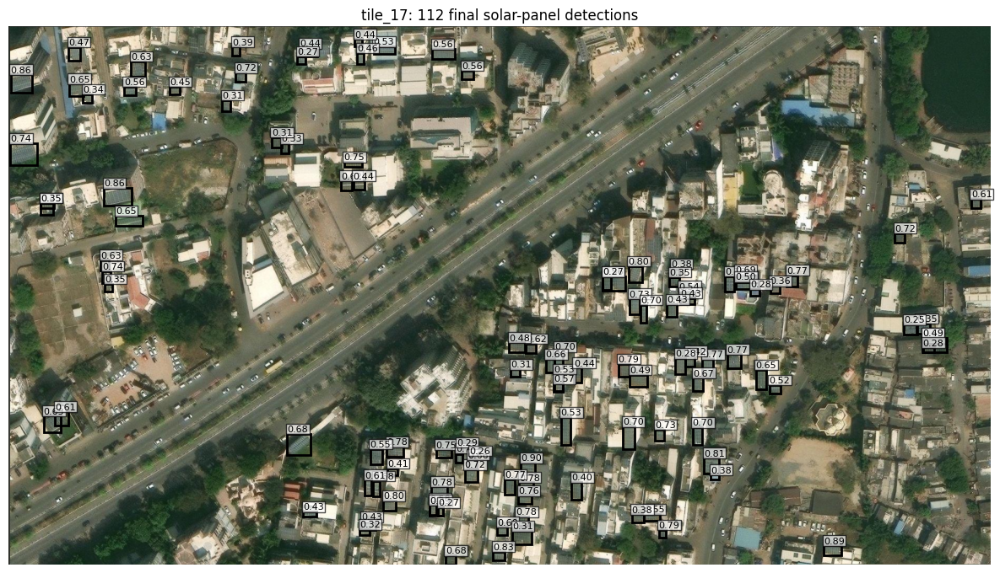

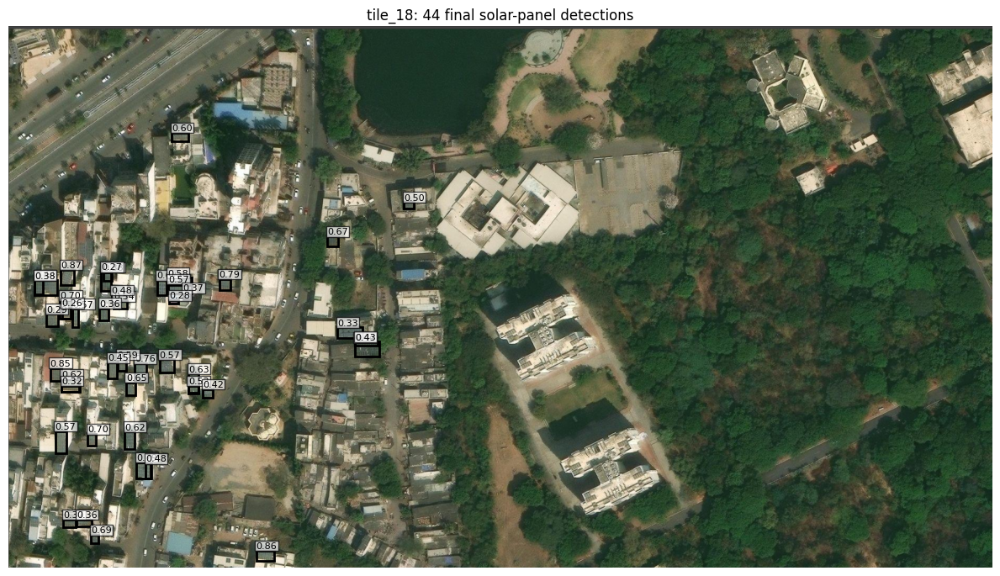

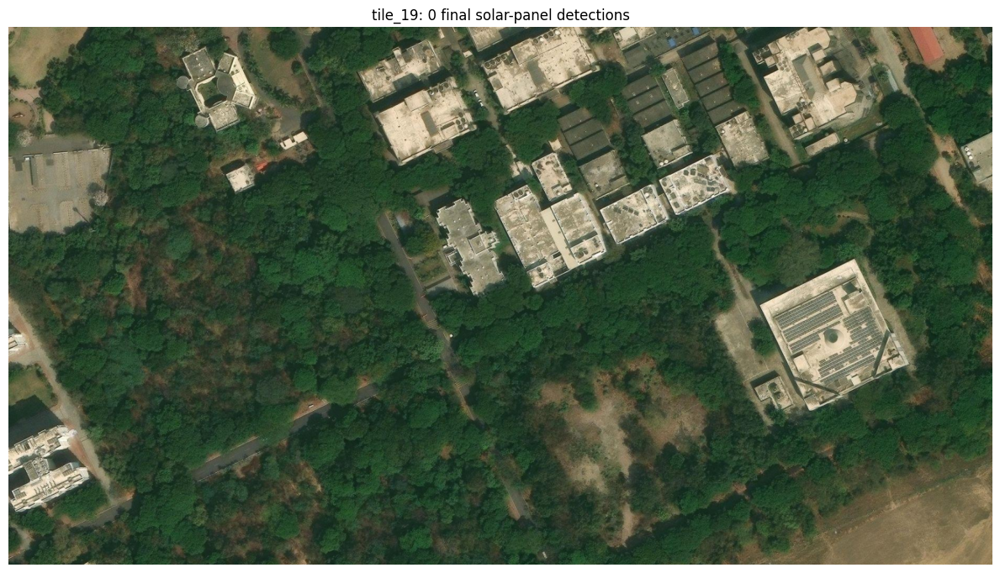

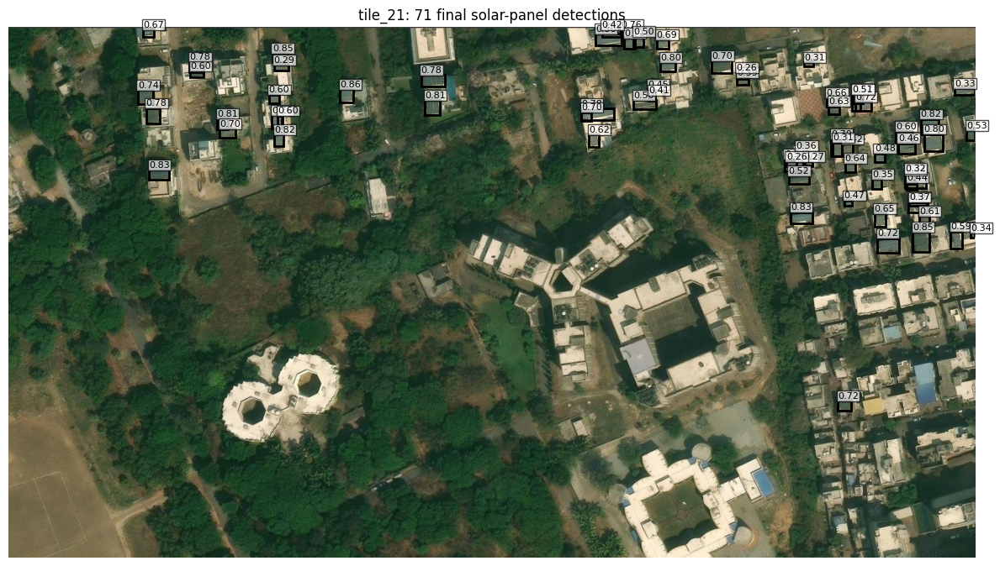

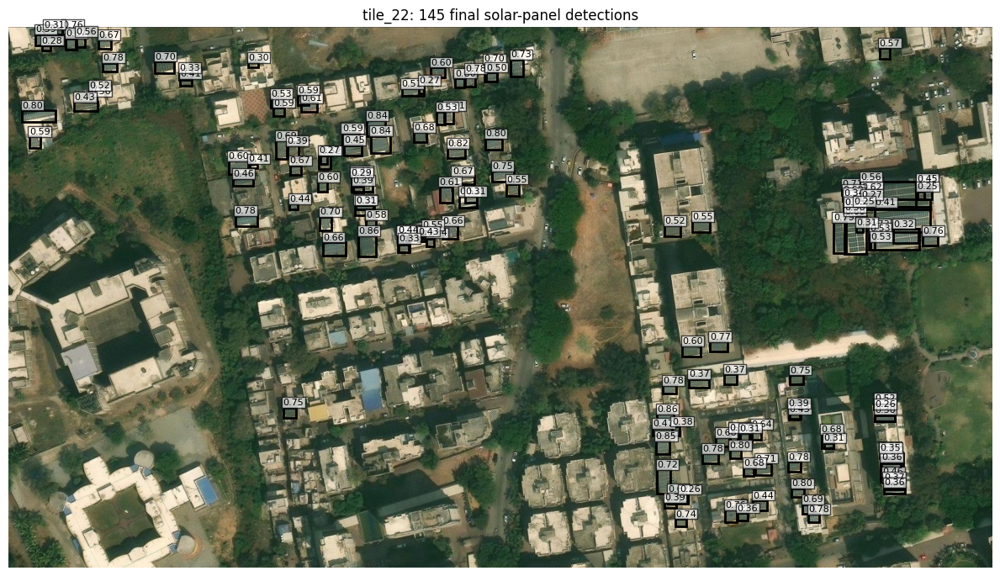

Saved visualizations to: solar_panel_detections_visualized


In [ ]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt

OUTPUT_DIR = Path('solar_panel_detections_visualized')
OUTPUT_DIR.mkdir(exist_ok=True)

for tile_id, df in all_final.items():
    filename = filename_map[tile_id]
    img = cv2.imread(filename)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    fig, ax = plt.subplots(figsize=(12, 10))
    ax.imshow(rgb)

    for _, r in df.iterrows():
        x1, y1, x2, y2 = r[['x1', 'y1', 'x2', 'y2']]

        # Draw bounding box
        rect = plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            fill=False, linewidth=2
        )
        ax.add_patch(rect)

        # Add confidence text
        ax.text(
            x1, max(0, y1 - 4),
            f"{r['confidence']:.2f}",
            fontsize=8,
            bbox=dict(facecolor='white', alpha=0.7, pad=1)
        )

    # Finalize and save the plot
    ax.set_title(f"{tile_id}: {len(df)} final solar-panel detections")
    ax.axis('off')
    plt.tight_layout()

    out_path = OUTPUT_DIR / f"{tile_id}_final_detections.png"
    fig.savefig(out_path, dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)

print("Saved visualizations to:", OUTPUT_DIR)

## 11. Convert original tile pixels to latitude/longitude

This follows the same geographic convention already used in Phase 4:

- `top_left = [lat, lon]`
- `bottom_right = [lat, lon]`
- original tile pixel `(x, y)` is converted using the original tile width/height.

**Never use crop dimensions here.**

That is what preserves alignment with `footprints.geojson`.


In [ ]:

def pixel_to_latlon(px, py, img_width, img_height, top_left, bottom_right):
    lat = top_left[0] + (py / img_height) * (bottom_right[0] - top_left[0])
    lon = top_left[1] + (px / img_width) * (bottom_right[1] - top_left[1])
    return lat, lon


def detection_to_polygon(row, img_width, img_height, top_left, bottom_right):
    pixel_points = [
        (row.x1, row.y1),
        (row.x2, row.y1),
        (row.x2, row.y2),
        (row.x1, row.y2),
        (row.x1, row.y1),
    ]

    coords = []
    for x, y in pixel_points:
        lat, lon = pixel_to_latlon(
            x, y,
            img_width, img_height,
            top_left, bottom_right
        )
        coords.append((lon, lat))

    return Polygon(coords)


geo_rows = []

for tile_id, df in all_final.items():
    filename = filename_map[tile_id]
    img = cv2.imread(filename)
    h, w = img.shape[:2]

    if tile_id not in tile_registry:
        raise KeyError(f"{tile_id} missing from tile_registry.json")

    top_left = tile_registry[tile_id]['top_left']
    bottom_right = tile_registry[tile_id]['bottom_right']

    for _, row in df.iterrows():
        poly = detection_to_polygon(
            row, w, h,
            top_left, bottom_right
        )

        if poly.is_valid and poly.area > 0:
            geo_rows.append({
                'panel_id': row.panel_id,
                'source_tile': tile_id,
                'confidence': row.confidence,
                'class_id': row.class_id,
                'x1_px': row.x1,
                'y1_px': row.y1,
                'x2_px': row.x2,
                'y2_px': row.y2,
                'geometry': poly
            })

solar_gdf = gpd.GeoDataFrame(geo_rows, crs='EPSG:4326')

print("Final panels:", len(solar_gdf))
print(solar_gdf.head())


Final panels: 372
        panel_id source_tile  confidence  class_id        x1_px       y1_px  \
0  tile_17-P0001     tile_17    0.902302         1   902.586182  769.677002   
1  tile_17-P0002     tile_17    0.894224         1  1436.280640  915.628723   
2  tile_17-P0003     tile_17    0.860912         1     3.224022   84.383728   
3  tile_17-P0004     tile_17    0.856944         1   167.904022  284.884216   
4  tile_17-P0005     tile_17    0.830962         1   853.361938  926.454956   

         x2_px       y2_px                                           geometry  
0   927.390259  790.917847  POLYGON ((72.77803 21.16202, 72.77807 21.16202...  
1  1467.566528  933.817261  POLYGON ((72.77892 21.1616, 72.77898 21.1616, ...  
2    41.878319  115.822479  POLYGON ((72.77652 21.16397, 72.77659 21.16397...  
3   216.485199  315.863586  POLYGON ((72.7768 21.1634, 72.77688 21.1634, 7...  
4   874.650269  941.561157  POLYGON ((72.77795 21.16157, 72.77798 21.16157...  


## 12. Save the geospatial outputs

These are the important handoff files for Phase 6.

### `solar_panels.geojson`
Geographic panel rectangles in EPSG:4326, ready to overlay in Leaflet or match against rooftop footprints.

### `solar_panel_detections.csv`
Keeps the original tile pixel boxes + confidence, useful for debugging and reproducibility.


In [ ]:

solar_gdf.to_file('solar_panels.geojson', driver='GeoJSON')

csv_df = solar_gdf.drop(columns='geometry').copy()
csv_df.to_csv('solar_panel_detections.csv', index=False)

print("Saved:")
print(" - solar_panels.geojson")
print(" - solar_panel_detections.csv")


Saved:
 - solar_panels.geojson
 - solar_panel_detections.csv


## 13. Quick GIS sanity check

This is an important checkpoint.

The panel rectangles should appear in the correct geographic area and should not be globally shifted, mirrored, or rotated.

A successful plot here means the YOLO crop strategy has been connected back to the Phase 4 geographic coordinate system.


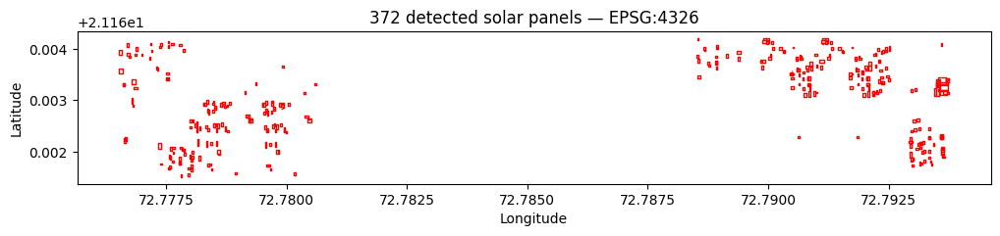

In [ ]:

ax = solar_gdf.plot(
    figsize=(12, 10),
    facecolor='none',
    edgecolor='red',
    linewidth=1
)

ax.set_title(f"{len(solar_gdf)} detected solar panels — EPSG:4326")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.show()


## 14. Download outputs



In [ ]:

from google.colab import files

files.download('solar_panels.geojson')
files.download('solar_panel_detections.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **CHECKING MODELS PARAMETERS**

In [ ]:
from ultralytics import YOLO

# 1. Load your custom trained model checkpoint
model = YOLO("/content/best.pt")

# 2. Run validation on your dataset (uses validation split defined in your data.yaml)
metrics = model.val()

# 3. Extract the specific mAP scores
map50_95 = metrics.box.map      # mAP@0.5:0.95 (COCO standard)
map50 = metrics.box.map50      # mAP@0.5
map75 = metrics.box.map75      # mAP@0.75

print(f"mAP@0.5:0.95 -> {map50_95:.4f}")
print(f"mAP@0.5      -> {map50:.4f}")

Ultralytics 8.4.130 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


FileNotFoundError: '/content/Rooftop-Solar-PV-Detection--3/data.yaml' does not exist

# P5.4 CHECKPOINT — STOP HERE

Before moving to Phase 6, verify:

- [ ] Full-tile inference problem is confirmed by calibration.
- [ ] The ~1/8 crop (or your known successful crop scale) detects panels.
- [ ] Every original tile is completely covered by overlapping crops.
- [ ] Final boxes are visibly on real solar panels.
- [ ] Duplicate detections from overlapping crops have been removed.
- [ ] Boxes are expressed in original-tile pixel coordinates.
- [ ] `solar_panels.geojson` plots over the correct Surat location.
- [ ] `solar_panel_detections.csv` contains panel IDs, tile IDs, confidence and original pixel boxes.

### Do not calculate final solar capacity yet.

The next phase should use the clean geospatial panel detections together with `footprints.geojson` to determine which panels belong to which rooftops.

Final architecture:

**clickable rooftop → detected panels → area → estimated capacity → Leaflet map**
